In [1]:
pip install dataprep

     |████████████████████████████████| 194kB 7.7MB/s 
     |████████████████████████████████| 368kB 13.5MB/s 
     |████████████████████████████████| 1.4MB 14.7MB/s 
     |████████████████████████████████| 1.3MB 31.4MB/s 
     |████████████████████████████████| 10.1MB 19.6MB/s 
     |████████████████████████████████| 727kB 46.7MB/s 
     |████████████████████████████████| 81kB 11.2MB/s 
     |████████████████████████████████| 849kB 52.4MB/s 
     |████████████████████████████████| 143kB 42.8MB/s 
     |████████████████████████████████| 296kB 47.5MB/s 
     |████████████████████████████████| 51kB 7.6MB/s 
     |████████████████████████████████| 112kB 49.1MB/s 
  Created wheel for nltk: filename=nltk-3.5-cp37-none-any.whl size=1434677 sha256=358b5380937fab7896a8e73c7e8e2871e29ab0fa8c0d2d56be4b7f4645721b17
  Stored in directory: /root/.cache/pip/wheels/ae/8c/3f/b1fe0ba04555b08b57ab52ab7f86023639a526d8bc8d384306
Successfully built nltk
  Found existing installation: wordcloud 1.5.0
    Un

In [2]:
#import libraries
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
from dataprep.eda import plot, plot_correlation, plot_missing, create_report
import pytz
import statsmodels.api as sm
from statsmodels.formula.api import ols

NumExpr defaulting to 2 threads.
/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
from google.colab import files
uploaded = files.upload()

Saving 20160101_20201231_ProductionData.xlsx to 20160101_20201231_ProductionData.xlsx


In [4]:
import io
df1 = pd.read_excel(io.BytesIO(uploaded['20160101_20201231_ProductionData.xlsx'],),sheet_name=0)
df2 = pd.read_excel(io.BytesIO(uploaded['20160101_20201231_ProductionData.xlsx'],),sheet_name=1)
df3 = pd.read_excel(io.BytesIO(uploaded['20160101_20201231_ProductionData.xlsx'],),sheet_name=2)

# Production Data EDA

In [ ]:
df1.head()


,StartDate,BatchNumber,CustItem,Dryer,Flow,Hygroscopicity,Bulk Density,Moisture Target,ScheduledDryQty,ActualDryQty,YieldPercentage,Rate,DryingTime_Hrs,CleanTime_Hrs,DownTime_Hrs,TotalRunTime_Hrs
0,2016-01-02 08:54:58.000,NJSD313825,10013-0000,Dryer 04,Good,Medium,Target = 0.30 g/mL,2 to 4% Max,333.7357,352.2000,105.5,146.750000,2.4,5.1,0.0,7.5
1,2016-01-02 11:06:57.863,NJSD312807,10558-0000,Dryer 03,Good,Medium,Record,10% Max.,4270.4120,3935.3999,92.2,468.499988,8.4,0.2,4.2,12.8
2,2016-01-02 21:40:51.470,NJSD313826,10447-0000,Dryer 04,Good,Medium,NaN,3% Max,1353.0969,1195.9000,88.4,123.288660,9.7,5.7,0.9,16.2
3,2016-01-02 22:45:11.673,NJSD312677,24164-0000,Dryer 02,Good,Medium,NaN,5% Max,19549.0975,18185.1000,93.0,335.518450,54.2,11.1,7.6,72.8
4,2016-01-03 00:10:32.910,NJSD314508,10558-0000,Dryer 03,Good,Medium,Record,10% Max.,4282.1720,3373.1999,78.8,411.365841,8.2,0.1,3.5,11.8


In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9970 entries, 0 to 9969
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   StartDate         9970 non-null   datetime64[ns]
 1   BatchNumber       9970 non-null   object        
 2   CustItem          9969 non-null   object        
 3   Dryer             9970 non-null   object        
 4   Flow              9946 non-null   object        
 5   Hygroscopicity    9946 non-null   object        
 6   Bulk Density      3859 non-null   object        
 7   Moisture Target   9953 non-null   object        
 8   ScheduledDryQty   9969 non-null   float64       
 9   ActualDryQty      9956 non-null   float64       
 10  YieldPercentage   9961 non-null   float64       
 11  Rate              9940 non-null   float64       
 12  DryingTime_Hrs    9970 non-null   float64       
 13  CleanTime_Hrs     9970 non-null   float64       
 14  DownTime_Hrs      9970 n

In [ ]:
df1.describe()

,ScheduledDryQty,ActualDryQty,YieldPercentage,Rate,DryingTime_Hrs,CleanTime_Hrs,DownTime_Hrs,TotalRunTime_Hrs
count,9969.000000,9956.000000,9961.000000,9940.000000,9970.000000,9970.000000,9970.000000,9970.000000
mean,8944.790131,8348.359213,91.201797,399.551580,21.749438,6.338947,4.594062,32.647111
std,13974.410504,13350.619864,13.609560,720.909417,23.245920,6.556123,7.562932,29.971184
min,5.680500,0.100000,0.000000,0.125880,0.000000,-9.200000,0.000000,0.000000
25%,1559.935000,1423.374925,88.700000,200.000000,5.700000,3.500000,0.600000,12.200000
50%,4400.696400,4263.649950,93.300000,352.783120,13.900000,5.300000,1.900000,22.500000
75%,10878.646600,10034.850000,96.600000,540.896418,30.600000,7.700000,5.500000,42.800000
max,301195.720000,293923.198200,864.900000,65548.998000,221.500000,172.100000,127.400000,284.700000


# Column Interpretation:
- StartDate: start time of the batch (DT)
- BatchNumber: Batch number of spray drying (C)
- CustItem: Customer item number (C)
- Dryer: Assigned Dryer (C)
- Flow: Flow condition (C)
- Hygroscopicity: attracting and holding water molecules (C)
- Bulk Density: Increased density, smaller particle size (C)
- Moisture Target: moisture target of the spray dired goods (C)
- ScheduledDryQty: Scheduled Dry Quantity of the product (N)
- ActualDryQty: Actual dried quantity of the product (N)
- YieldPercentage: How much did the production actually yielded respect to scheduled qty. <br>
<b> Actual / Scheduled * 100 </b> (N)
- Rate: How much processed in 1 hr. <br> <b> ActualDryQty / DryingTime_Hrs </b> (N)
- DryingtimeHrs: spray dry processing time (N)
- CleaningtimeHrs: Cleaning Time (N)
- DowntimeHrs: Downtime in between (N)
- TotalRunTime: Drying + Cleaning + Downtime. (N)



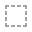
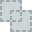
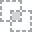
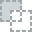
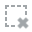
...
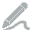
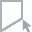
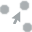
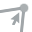
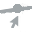

In [ ]:
#General plot 
plot(df1)

'''
General implications about each columns
Bulk Density: Values must be transformed and cleaned by categories (e.g. Tapped density)
Moisture Target: Transformed and merged into categorization (e.g. 1~3%, 5% max.. etc)
YieldPercentage: Some high outliers must be explained..
Rate: Possible candidate to record performances of spray drying. (0~1311 takes 99.18%)
Rate vs. Drying time: Which explains performance?


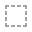
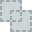
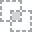
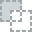
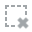
...
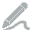
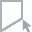
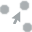
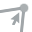
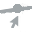

In [ ]:
plot(df1, "DryingTime_Hrs", "CleanTime_Hrs")


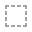
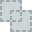
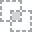
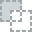
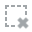
...
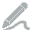
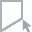
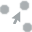
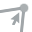
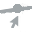

In [ ]:
#Dryer by Flow
plot(df1, "Flow", "Dryer")


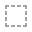
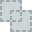
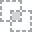
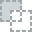
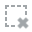
...
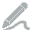
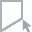
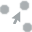
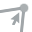
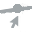

In [ ]:
plot(df1, "Rate", "Dryer")

In [ ]:
plot(df1, )


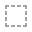
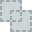
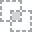
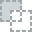
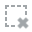
...
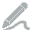
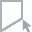
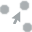
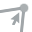
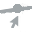

In [ ]:
#Dryer by YieldPercentage	
plot(df1, "YieldPercentage", "Dryer")


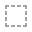
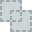
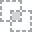
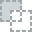
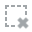
...
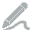
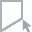
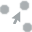
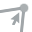
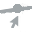

In [ ]:
#Correlation of numerical values
plot_correlation(df1)


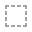
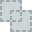
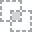
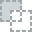
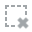
...
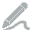
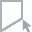
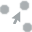
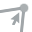
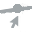

In [ ]:
#Missing value info
plot_missing(df1)

                sum_sq      df           F         PR(>F)
Dryer     7.479529e+05     9.0  178.428615  3.819104e-315
Residual  4.639023e+06  9960.0         NaN            NaN


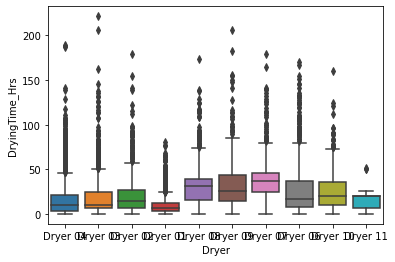

In [ ]:
#DryingTime_Hrs group by Dryer
box1 = sns.boxplot(x='Dryer', y='DryingTime_Hrs', data=df1)

mod = ols('DryingTime_Hrs ~ Dryer', data=df1).fit()
aov_table = sm.stats.anova_lm(mod, typ=2)
print(aov_table)

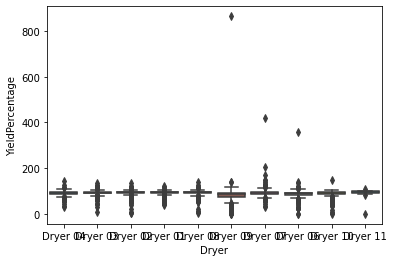

In [ ]:
box2 = sns.boxplot(x='Dryer', y='YieldPercentage', data=df1)


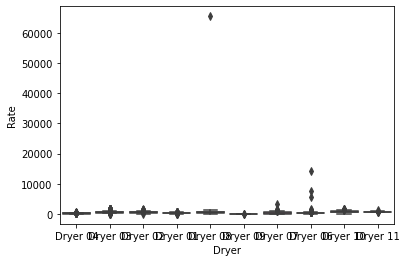

In [ ]:
box3 = sns.boxplot(x='Dryer', y='Rate', data=df1)


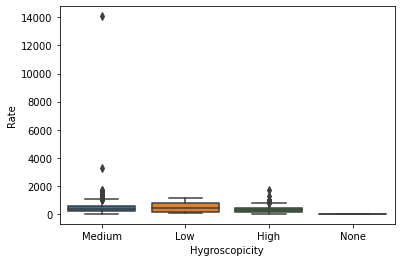

In [ ]:
sns.boxplot(x='Hygroscopicity', y = 'Rate', data=df1)

# Middlesex NJ EDA

Column interpretation
- Time Obj: dt, dt_iso, timezone
- Location Obj: City_name, lat, lon
- Numerical weather data: Temp, feels_like, temp_min, temp_max, pressure, sea_level, grnd_level, humidity, wind_speed, wind_deg, rain, snow
- Categorical weather data: clouds_all, weather_id, weather_name, weather_description, weather_icon

In [ ]:
df2.head()

,dt,dt_iso,timezone,city_name,lat,lon,temp,feels_like,temp_min,temp_max,pressure,sea_level,grnd_level,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_1h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,1451606400,2016-01-01 00:00:00 +0000 UTC,-18000,Middlesex,40.572603,-74.492654,43.93,37.06,42.80,46.30,1019,NaN,NaN,62,5.82,280,NaN,NaN,NaN,NaN,75,803,Clouds,broken clouds,04n
1,1451610000,2016-01-01 01:00:00 +0000 UTC,-18000,Middlesex,40.572603,-74.492654,43.65,38.10,42.80,46.02,1020,NaN,NaN,62,3.36,0,NaN,NaN,NaN,NaN,90,804,Clouds,overcast clouds,04n
2,1451613600,2016-01-01 02:00:00 +0000 UTC,-18000,Middlesex,40.572603,-74.492654,43.27,36.12,42.80,45.11,1020,NaN,NaN,59,5.82,300,NaN,NaN,NaN,NaN,90,804,Clouds,overcast clouds,04n
3,1451617200,2016-01-01 03:00:00 +0000 UTC,-18000,Middlesex,40.572603,-74.492654,42.62,36.14,42.08,44.20,1020,NaN,NaN,61,4.70,0,NaN,NaN,NaN,NaN,90,804,Clouds,overcast clouds,04n
4,1451620800,2016-01-01 04:00:00 +0000 UTC,-18000,Middlesex,40.572603,-74.492654,42.08,35.42,41.00,43.56,1020,NaN,NaN,59,4.70,290,NaN,NaN,NaN,NaN,90,804,Clouds,overcast clouds,04n


In [ ]:
df2.describe()

,dt,timezone,lat,lon,temp,feels_like,temp_min,temp_max,pressure,sea_level,grnd_level,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_1h,snow_3h,clouds_all,weather_id
count,4.664600e+04,46646.000000,4.664600e+04,4.664600e+04,46646.000000,46646.000000,46646.000000,46646.000000,46646.000000,0.0,0.0,46646.000000,46646.00000,46646.000000,6618.000000,680.000000,867.000000,85.000000,46646.000000,46646.000000
mean,1.530844e+09,-15679.055010,4.057260e+01,-7.449265e+01,54.448459,51.034157,51.615680,57.623433,1016.520581,NaN,NaN,71.309158,6.09488,186.369957,1.328794,3.158824,0.941188,3.174118,42.669832,754.839922
std,4.538920e+07,1722.985769,3.388615e-11,4.794794e-11,18.027790,22.530874,18.081953,17.888518,8.004557,NaN,NaN,21.767560,3.21292,121.388894,1.914734,4.167552,1.009039,3.890133,41.558155,98.136542
min,1.451606e+09,-18000.000000,4.057260e+01,-7.449265e+01,0.300000,-12.680000,-4.000000,3.200000,933.000000,NaN,NaN,8.000000,0.00000,0.000000,0.100000,0.300000,0.060000,0.300000,0.000000,200.000000
25%,1.491578e+09,-18000.000000,4.057260e+01,-7.449265e+01,39.940000,32.490000,37.400000,43.040000,1012.000000,NaN,NaN,53.000000,3.56000,69.000000,0.300000,0.500000,0.250000,0.500000,1.000000,800.000000
50%,1.531197e+09,-14400.000000,4.057260e+01,-7.449265e+01,54.300000,49.750000,51.800000,57.510000,1017.000000,NaN,NaN,76.000000,5.53000,209.000000,0.640000,1.800000,0.510000,1.800000,20.000000,800.000000
75%,1.570150e+09,-14400.000000,4.057260e+01,-7.449265e+01,69.640000,70.630000,66.200000,72.580000,1022.000000,NaN,NaN,92.000000,7.38000,300.000000,1.500000,4.100000,1.280000,5.300000,90.000000,802.000000
max,1.609456e+09,-14400.000000,4.057260e+01,-7.449265e+01,96.870000,105.350000,95.000000,100.000000,1044.000000,NaN,NaN,100.000000,28.86000,360.000000,50.500000,37.300000,8.400000,21.100000,100.000000,804.000000


In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46646 entries, 0 to 46645
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   dt                   46646 non-null  int64  
 1   dt_iso               46646 non-null  object 
 2   timezone             46646 non-null  int64  
 3   city_name            46646 non-null  object 
 4   lat                  46646 non-null  float64
 5   lon                  46646 non-null  float64
 6   temp                 46646 non-null  float64
 7   feels_like           46646 non-null  float64
 8   temp_min             46646 non-null  float64
 9   temp_max             46646 non-null  float64
 10  pressure             46646 non-null  int64  
 11  sea_level            0 non-null      float64
 12  grnd_level           0 non-null      float64
 13  humidity             46646 non-null  int64  
 14  wind_speed           46646 non-null  float64
 15  wind_deg             46646 non-null 

Computing series-sum-chunk-series-sum-agg-611bac446450fcd6de843afdaebaaf51:  63%|██████▎   | 1298/2068 [00:01<00:00, 1824.92it/s]/usr/local/lib/python3.7/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.7/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))



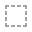
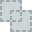
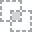
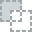
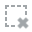
...
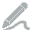
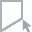
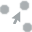
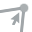
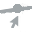

In [ ]:
plot(df2)


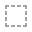
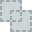
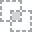
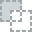
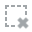
...
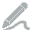
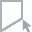
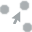
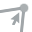
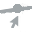

In [ ]:
plot_correlation(df2)


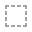
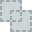
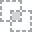
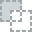
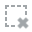
...
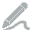
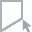
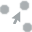
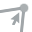
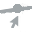

In [ ]:
plot_missing(df2)



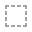
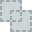
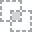
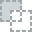
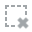
...
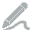
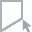
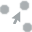
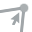
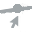

In [ ]:
plot(df2, 'wind_speed', 'humidity')


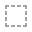
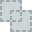
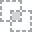
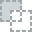
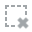
...
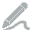
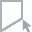
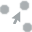
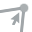
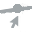

In [ ]:
plot(df2, 'temp', 'humidity')

# Bethlehem PA EDA

Column interpretation
- Time Obj: dt, dt_iso, timezone
- Location Obj: City_name, lat, lon
- Numerical weather data: Temp, feels_like, temp_min, temp_max, pressure, sea_level, grnd_level, humidity, wind_speed, wind_deg, rain, snow
- Categorical weather data: clouds_all, weather_id, weather_name, weather_description, weather_icon

In [7]:
df3.head(5)

,dt,dt_iso,timezone,city_name,lat,lon,temp,feels_like,temp_min,temp_max,pressure,sea_level,grnd_level,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_1h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,1451606400,2016-01-01 00:00:00 +0000 UTC,-18000,Bethlehem,40.625932,-75.370458,41.43,32.81,39.92,43.08,1020,NaN,NaN,59,8.05,290,NaN,NaN,NaN,NaN,90,804,Clouds,overcast clouds,04n
1,1451610000,2016-01-01 01:00:00 +0000 UTC,-18000,Bethlehem,40.625932,-75.370458,40.84,32.77,39.20,42.28,1020,NaN,NaN,59,6.93,280,NaN,NaN,NaN,NaN,90,804,Clouds,overcast clouds,04n
2,1451613600,2016-01-01 02:00:00 +0000 UTC,-18000,Bethlehem,40.625932,-75.370458,40.19,29.37,39.02,41.57,1020,NaN,NaN,56,11.41,280,NaN,NaN,NaN,NaN,90,804,Clouds,overcast clouds,04n
3,1451617200,2016-01-01 03:00:00 +0000 UTC,-18000,Bethlehem,40.625932,-75.370458,39.65,28.92,39.02,40.61,1020,NaN,NaN,59,11.41,280,NaN,NaN,NaN,NaN,90,804,Clouds,overcast clouds,04n
4,1451620800,2016-01-01 04:00:00 +0000 UTC,-18000,Bethlehem,40.625932,-75.370458,38.61,30.38,37.40,40.18,1020,NaN,NaN,61,6.93,280,NaN,NaN,NaN,NaN,90,804,Clouds,overcast clouds,04n


In [8]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45592 entries, 0 to 45591
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   dt                   45592 non-null  int64  
 1   dt_iso               45592 non-null  object 
 2   timezone             45592 non-null  int64  
 3   city_name            45592 non-null  object 
 4   lat                  45592 non-null  float64
 5   lon                  45592 non-null  float64
 6   temp                 45592 non-null  float64
 7   feels_like           45592 non-null  float64
 8   temp_min             45592 non-null  float64
 9   temp_max             45592 non-null  float64
 10  pressure             45592 non-null  int64  
 11  sea_level            0 non-null      float64
 12  grnd_level           0 non-null      float64
 13  humidity             45592 non-null  int64  
 14  wind_speed           45592 non-null  float64
 15  wind_deg             45592 non-null 

In [9]:
df3.describe()

,dt,timezone,lat,lon,temp,feels_like,temp_min,temp_max,pressure,sea_level,grnd_level,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_1h,snow_3h,clouds_all,weather_id
count,4.559200e+04,45592.000000,4.559200e+04,4.559200e+04,45592.000000,45592.000000,45592.000000,45592.000000,45592.000000,0.0,0.0,45592.000000,45592.000000,45592.000000,5914.000000,661.000000,678.000000,65.000000,45592.000000,45592.000000
mean,1.530767e+09,-15675.223723,4.062593e+01,-7.537046e+01,53.504228,48.540455,50.930658,56.100688,1016.642284,NaN,NaN,65.516363,7.441548,201.115349,1.228049,3.484418,1.749513,4.190769,43.703873,757.695319
std,4.555447e+07,1721.823128,4.609341e-11,1.907118e-11,18.279196,22.337967,18.313831,18.313770,7.751004,NaN,NaN,18.633270,4.304535,105.289941,1.890776,5.260768,5.316209,6.738873,41.298097,100.463918
min,1.451606e+09,-18000.000000,4.062593e+01,-7.537046e+01,-3.280000,-15.520000,-13.000000,1.210000,976.000000,NaN,NaN,2.000000,0.090000,0.000000,0.100000,0.300000,0.060000,0.300000,0.000000,200.000000
25%,1.491299e+09,-18000.000000,4.062593e+01,-7.537046e+01,38.570000,29.910000,36.000000,41.000000,1012.000000,NaN,NaN,51.000000,4.610000,100.000000,0.300000,0.500000,0.260000,0.800000,1.000000,800.000000
50%,1.530790e+09,-14400.000000,4.062593e+01,-7.537046e+01,53.580000,47.630000,51.010000,55.990000,1017.000000,NaN,NaN,67.000000,5.930000,230.000000,0.510000,1.500000,0.510000,1.300000,40.000000,800.000000
75%,1.570350e+09,-14400.000000,4.062593e+01,-7.537046e+01,68.810000,68.160000,66.200000,71.600000,1022.000000,NaN,NaN,82.000000,9.170000,286.000000,1.300000,4.100000,1.157500,6.100000,90.000000,803.000000
max,1.609456e+09,-14400.000000,4.062593e+01,-7.537046e+01,95.320000,102.270000,95.000000,98.600000,1044.000000,NaN,NaN,100.000000,39.150000,360.000000,32.510000,42.400000,35.560000,35.600000,100.000000,804.000000


Computing finalize-ed445845-0f38-4347-8244-f4872e32deee:  89%|████████▊ | 1835/2068 [00:01<00:00, 2233.44it/s]                                                                 /usr/local/lib/python3.7/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.7/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))



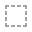
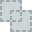
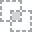
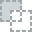
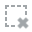
...
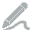
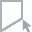
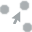
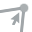
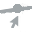

In [5]:
plot(df3)


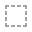
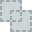
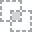
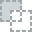
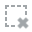
...
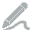
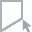
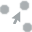
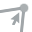
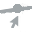

In [10]:
plot_missing(df3)